<a href="https://colab.research.google.com/github/gautamkr1876/AIML_ClassNotes/blob/main/7.%20Advanced%20AI%20Agents/8.%20Scaling%20AI%20Applications/Scaling_AI_Applications.ipynb" target="_blank">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## 1. Introduction: Throughput vs Latency — The Two Metrics That Define Scale

Before we can talk about scaling LLM-based applications, we need to build a shared vocabulary around two fundamental system metrics: **throughput** and **latency**. Every architectural decision you'll encounter in this tutorial — batching strategies, parallelism schemes, memory optimizations — ultimately traces back to a trade-off between these two quantities.

### Latency

Latency is the elapsed wall-clock time for a single unit of work to complete, measured from the moment a request enters the system to the moment a response is produced. In the context of LLM applications, this is the time a user waits between sending a prompt and receiving the final generated token. Latency is measured in units of time (milliseconds, seconds).

### Throughput

Throughput is the sustained rate of completed work over a period of time — how many items the system can finish per second. For an LLM serving system, this might be measured in requests per second or tokens per second across all concurrent users. Throughput is bounded by the slowest stage in the pipeline and the degree of available parallelism.

### Why the Distinction Matters

These two metrics are not simply inverses of each other. A system can have excellent throughput (processing thousands of requests per second across a fleet) while individual request latency remains high. Conversely, a single GPU serving one user at a time may deliver ultra-low latency but terrible throughput.

The tension becomes especially sharp when individual tasks are small relative to system overhead. When each task is small, startup and scheduling costs dominate — speeding up the task itself barely changes end-to-end time, and throughput won't improve unless you run many tasks in parallel.

This raises a natural question that will guide the rest of this tutorial:

> **Is LLM training a latency problem or a throughput problem? What about inference?**

Training is fundamentally a throughput problem — we want to push as many tokens through the model per second as possible, and we're willing to tolerate higher per-step latency if overall training time shrinks. Inference, on the other hand, is often latency-sensitive (a user is waiting for a response), but at scale it also becomes a throughput problem (serving millions of concurrent users cost-efficiently).

Understanding where your application sits on this spectrum is the first step toward making good scaling decisions. The sections that follow will give you the tools — from hardware mental models to parallelism strategies — to navigate these trade-offs effectively.

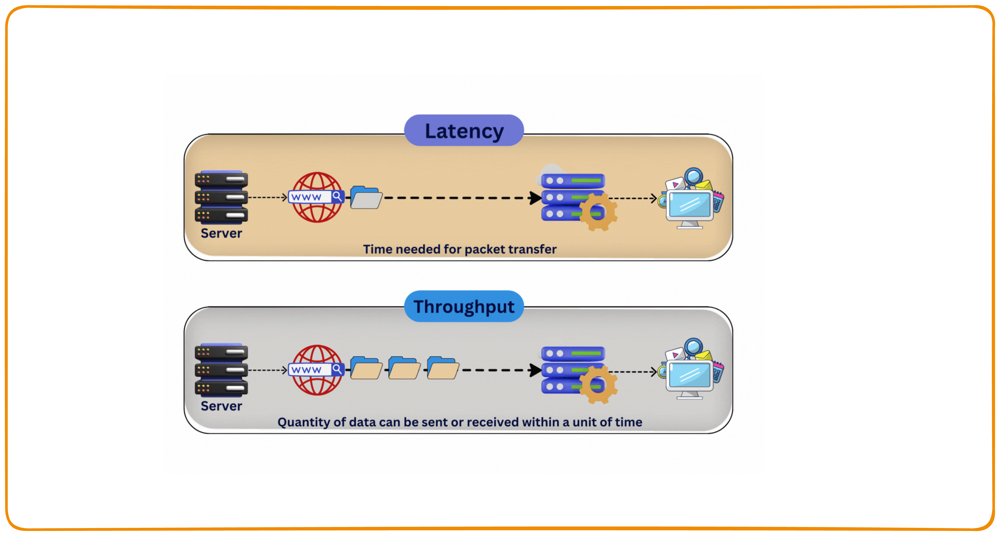

## 2. Benchmarks and Auto-Tuning: Measuring What Matters

Now that we have a shared understanding of latency and throughput, let's get concrete about how these metrics are measured in practice — and why they compete with each other.

### Key Inference Metrics

Before diving into benchmarking, we need a precise vocabulary for the metrics that matter in LLM serving:

- **TTFT (Time to First Token):** Time from request submission until the first output token is received. This is dominated by the prefill phase — the forward pass over all prompt tokens.

- **ITL (Inter-Token Latency):** Time between two consecutive output tokens (e.g., from token *i−1* to token *i*). This reflects the cost of each individual decode step.

- **TPOT (Time Per Output Token):** The average ITL across all output tokens in a request. A smoothed view of decode-phase performance.

- **E2E Latency (End-to-End):** Total wall-clock time to fully process a request, i.e., `TTFT + sum(all ITLs)`. The time between submitting a request and receiving the last output token.

- **Throughput:** Total tokens processed per second (input, output, or both), or alternatively requests per second across the system.

- **Goodput:** Throughput that meets service-level objectives (SLOs) — e.g., only counting tokens from requests where p99 TTFT < 200ms and p99 TPOT < 50ms.

Goodput is particularly important in production: raw throughput numbers are meaningless if half your users are experiencing unacceptable latency.

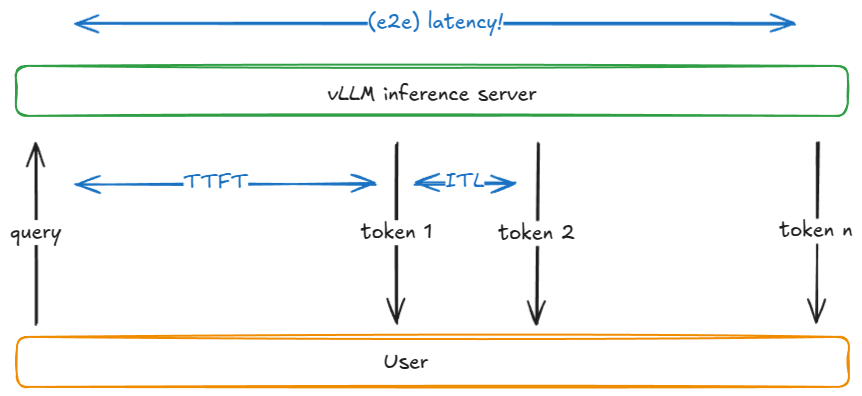

## 3. Introduction to vLLM

### 3.1 What is vLLM?

vLLM is an open-source, high-throughput inference and serving engine for LLMs. It is the most widely adopted serving framework in production today, designed to squeeze maximum performance out of GPU hardware while keeping the developer experience simple.

At its core, vLLM solves the key bottleneck of LLM inference: **GPU memory management**. Its signature technique — **PagedAttention** — manages the KV cache in fixed-size blocks (similar to virtual memory paging in operating systems), dramatically reducing memory fragmentation and allowing more concurrent requests to fit in VRAM.

### Why vLLM?

- **High throughput** — continuous batching, PagedAttention, and optimized CUDA kernels keep GPUs busy.
- **Low latency** — CUDA graph capture, FlashAttention integration, and efficient scheduling minimize per-token overhead.
- **Easy to use** — OpenAI-compatible API server out of the box. Swap in your model and serve.
- **Scalable** — built-in support for tensor parallelism, pipeline parallelism, and data parallelism across multi-GPU and multi-node setups.

### The LLM Engine: vLLM's Building Block

The LLM engine is the fundamental building block of vLLM. On its own, it already enables high-throughput inference — but only in an offline setting. You can't serve it to customers over the web yet.

Here's the simplest way to use it:

```python
from vllm import LLM, SamplingParams

prompts = [
    "Hello, my name is",
    "The president of the United States is",
]

sampling_params = SamplingParams(temperature=0.8, top_p=0.95)

def main():
    llm = LLM(model="Qwen/Qwen2.5-1.5B-Instruct")
    outputs = llm.generate(prompts, sampling_params)

if __name__ == "__main__":
    main()
```

This is **offline inference** — synchronous, single-GPU, no web server. From here, the rest of this tutorial will build up to online serving, benchmarking, and multi-GPU scaling.

### Installing vLLM

```bash
pip install vllm
```

> **Note:** vLLM requires a CUDA-capable GPU. For the full installation guide (including Docker images and source builds), see the [vLLM documentation](https://docs.vllm.ai/).

## 3.2 Hands-On: Benchmarking with vLLM CLI

### Pre-requisite: Download the Model

Before benchmarking, download the model from Hugging Face to avoid download latency contaminating your numbers:

```bash
pip install huggingface_hub
huggingface-cli download Qwen/Qwen2.5-1.5B-Instruct
```

### Running the Benchmarks

vLLM provides a built-in `vllm bench` CLI with three modes:

**Latency** — best-case per-step latency under controlled conditions:

```bash
vllm bench latency \
  --model Qwen/Qwen2.5-1.5B-Instruct \
  --input-len 32 \
  --output-len 128 \
  --batch-size 8
```

**Throughput** — peak offline throughput, all requests submitted at once:

```bash
vllm bench throughput \
  --model Qwen/Qwen2.5-1.5B-Instruct \
  --num-prompts 500 \
  --input-len 128 \
  --output-len 128
```

**Serve** — realistic online traffic with Poisson-distributed arrivals:

```bash
# Terminal 1: start the server
vllm serve Qwen/Qwen2.5-1.5B-Instruct --host 0.0.0.0 --port 8000

# Terminal 2: run the benchmark
vllm bench serve \
  --model Qwen/Qwen2.5-1.5B-Instruct \
  --host localhost \
  --port 8000 \
  --num-prompts 200 \
  --request-rate 4 \
  --input-len 128 \
  --output-len 128
```

> **Tip:** Vary `--request-rate` from low (1-2) to high (32+) to find the saturation point where latency spikes — that's your system's operating limit under the current config.

## 4. Why Percentiles Matter: P90, P95 & P99

Averages lie. A system can report an average latency of 50ms while 1 in 100 users waits over 2 seconds. In production LLM serving, it's the **tail** — the slowest requests — that users actually feel and complain about.

That's why we measure latency using **percentiles** instead of (or in addition to) averages:

- **P90 latency:** 90% of requests complete faster than this value. 1 in 10 requests is slower.
- **P95 latency:** 95% of requests complete faster than this value. 1 in 20 requests is slower.
- **P99 latency:** 99% of requests complete faster than this value. 1 in 100 requests is slower.

### Why Tail Latency Matters in LLM Serving

LLM workloads are particularly prone to tail latency issues because:

- **Variable prompt lengths** — a single long-prompt prefill can spike TTFT for that request and delay others sharing the GPU.
- **KV cache pressure** — as sequences grow, memory bandwidth demands increase, causing some decode steps to slow down unpredictably.
- **Resource contention** — prefill and decode compete for GPU compute and memory. A burst of new prefill requests can stall ongoing decodes, inflating ITL for in-flight users.

### How Percentiles Drive Production Decisions

Service Level Objectives (SLOs) are almost always defined in percentile terms, not averages. For example:

- *"P95 TTFT < 200ms"* — 95% of users see their first token within 200ms.
- *"P99 ITL < 50ms"* — 99% of inter-token gaps are under 50ms (smooth streaming experience).
- *"P99 E2E < 5s"* — 99% of requests complete within 5 seconds.

**Goodput** ties directly to this: it counts only the throughput from requests that *met* the SLO. A system pushing high tokens/sec but violating P99 targets has poor goodput — and unhappy users.

> **Rule of thumb:** If your P99 is more than 3–5× your median (P50), you have a tail latency problem worth investigating — look at scheduling policy, chunked prefill settings, or whether a few long-context requests are dominating GPU time.

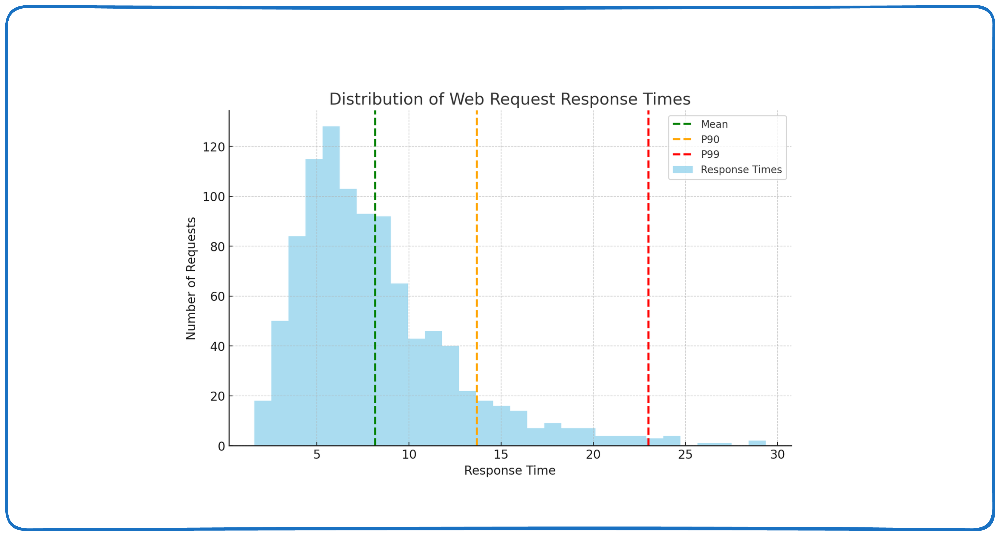

## 5. Scaling Strategy: Data Parallelism (DDP)

### The Core Idea

Data Parallelism is the simplest and most widely used strategy for scaling LLM training and inference across multiple GPUs. The idea is straightforward: **replicate the full model on each GPU** and **split the batch across them**. Each GPU processes a different slice of data independently, then gradients are synchronized to keep all replicas in lockstep.

### How It Works

1. **Replicate** — every GPU holds a complete copy of the model (weights, optimizer states, buffers).
2. **Partition the batch** — the global batch is divided into equal-sized micro-batches, one per GPU.
3. **Forward + Backward independently** — each GPU runs its own forward and backward pass on its local micro-batch.
4. **Synchronize gradients** — after backward, an **all-reduce** collective aggregates gradients across all GPUs so every replica sees the same averaged gradient.
5. **Update weights** — each GPU applies the identical optimizer step, keeping parameters consistent across all replicas.

Because every GPU applies the same update to the same starting weights, DDP is **mathematically equivalent** to training on a single GPU with the full global batch — it only re-partitions the work.

### What Gets Sharded (and What Doesn't)

- **Sharded:** Data / batch — each GPU gets different samples.
- **Not sharded:** Model weights, optimizer states, gradient buffers — all fully replicated on every GPU.

This is DDP's main limitation: it does **not** reduce per-GPU memory for model state. If the model doesn't fit on a single GPU, DDP alone won't help — you'll need Tensor Parallelism, Pipeline Parallelism, or optimizer sharding (ZeRO/FSDP).

### Communication Pattern

DDP introduces a single communication step per training iteration: the **gradient all-reduce**. This is typically implemented as a **reduce-scatter + all-gather** under the hood (via NCCL), and modern frameworks overlap it with backward computation using hooks — as soon as a layer's gradients are ready, the all-reduce for that layer launches while the next layer's backward is still running.

Communication volume scales with the number of parameters. As GPU count increases or network bandwidth decreases, this sync step can become the bottleneck.

### When DDP Bottlenecks

- **Compute-bound** — when the per-GPU batch is large enough to keep the GPU busy. This is the desirable regime.
- **Communication-bound** — as GPU count grows, the gradient all-reduce takes longer relative to compute. This is especially painful across nodes with slower inter-node interconnect (e.g., Ethernet vs NVLink/InfiniBand).

### Impact on Throughput and Latency

- **Throughput increases** — more GPUs process more tokens per second in parallel.
- **Latency may increase slightly** — synchronization overhead and stragglers (the slowest GPU in the group) add to per-step time.
- **Statistical efficiency** — the effective global batch size grows with GPU count. Very large batch sizes may require learning rate tuning or warmup schedule adjustments to maintain convergence quality.

### Practical Considerations

- **Choose the global batch size** so each GPU has enough work to stay busy and amortize the communication overhead.
- **Gradient bucketing** — frameworks like PyTorch group small gradient tensors into larger buckets before all-reduce, reducing the number of collective calls and improving bandwidth utilization.
- **Overlap communication with compute** — using backward hooks, gradient all-reduce runs concurrently with the remaining backward pass on separate CUDA streams, hiding much of the communication cost.

### When to Use DDP

DDP is the right starting point when:

- The model fits comfortably on a single GPU (weights + optimizer states + activations).
- You want to increase training throughput by adding more GPUs.
- You're already using other parallelism strategies (TP, PP) within a group of GPUs and want to replicate that group across additional nodes.

When memory becomes the constraint — model too large, context too long, optimizer states too heavy — you'll need to combine DDP with model parallelism (TP/PP) or move to sharded approaches like FSDP/ZeRO, which we'll cover in later sections.

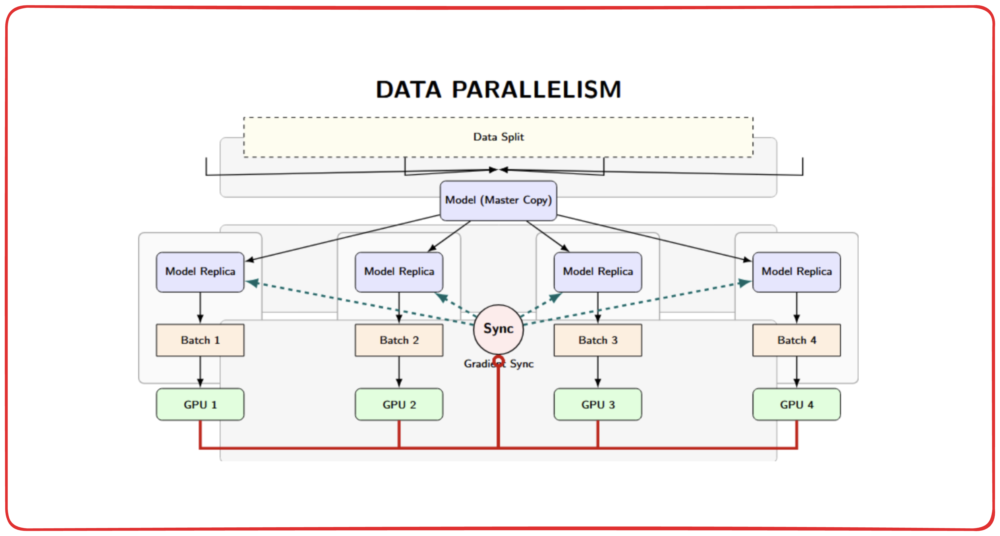

## 6. Scaling Strategy: Tensor Parallelism (TP)

### The Core Idea

Tensor Parallelism splits **individual layers** across multiple GPUs. Instead of each GPU holding a full copy of every weight matrix, each GPU stores and computes on a **shard** of the layer's weights. This is intra-layer parallelism — the split happens *within* a single matrix multiplication, not across layers.

### How It Works

TP exploits the fact that large linear operations (attention projections, MLP layers) can be decomposed into independent partial computations:

- **Column Parallelism** — split the weight matrix along the output dimension. Each GPU computes a slice of the output, then results are gathered (all-gather) to reconstruct the full output.
- **Row Parallelism** — split the weight matrix along the input dimension. Each GPU computes partial sums from its input slice, then results are combined (all-reduce or reduce-scatter) to produce the final output.

In a Transformer block, these two styles are typically paired: column-parallel for the first linear layer, row-parallel for the second, minimizing the number of communication points per block.

### Communication Pattern

TP requires **collectives inside every layer** — all-reduce, reduce-scatter, or all-gather depending on the sharding style. This happens during both forward and backward passes, making TP highly sensitive to interconnect bandwidth and latency.

This is why TP is almost always kept **within a single node** where GPUs are connected via fast NVLink, not across nodes with slower interconnect.

### What It Buys You

- **Memory:** per-GPU model state drops roughly by `1/TP_degree`.
- **Compute:** each GPU does less work per layer, enabling larger models to fit and run.
- **Throughput:** improves when compute savings outweigh communication overhead.

### When It Bottlenecks

- **Compute-bound** — when GEMMs are large enough to keep GPUs busy (the good regime).
- **Communication-bound** — as TP degree increases, more and larger collectives are needed per layer. Beyond a certain point, communication dominates and throughput degrades.

### Key Takeaway

TP makes large layers fit across GPUs and can improve throughput, but the per-layer communication cost means it works best at moderate degrees (typically 2, 4, or 8) over fast intra-node links. For scaling beyond a single node, combine TP with Pipeline Parallelism or Data Parallelism.

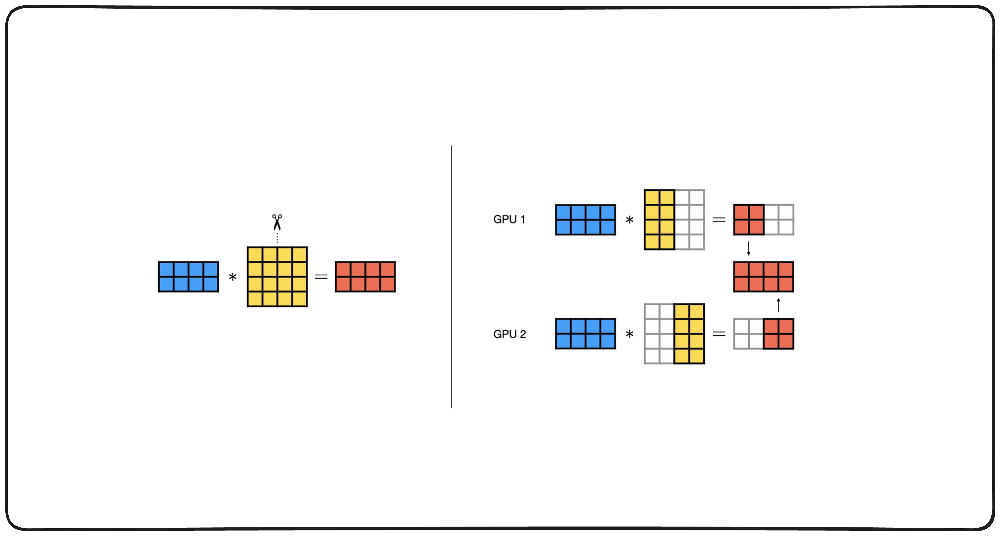

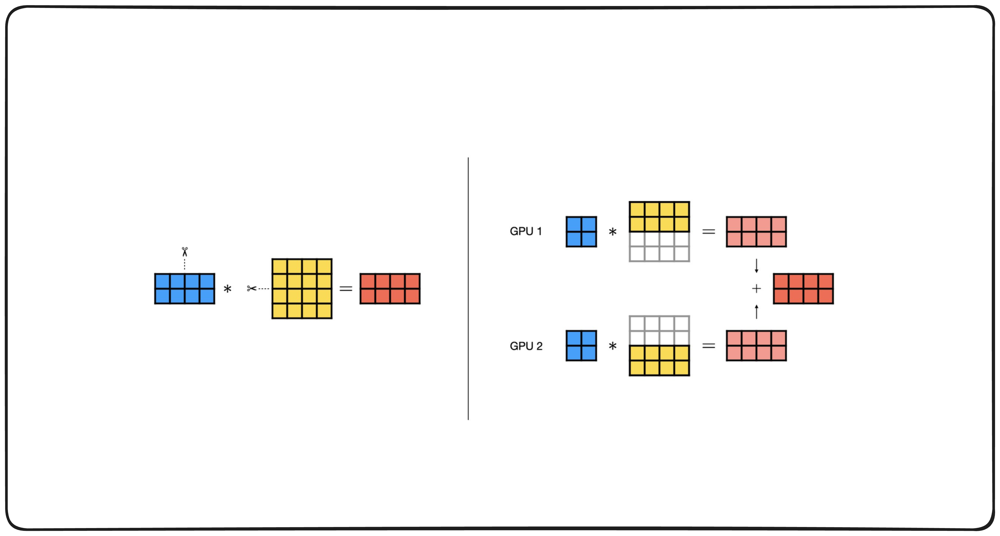

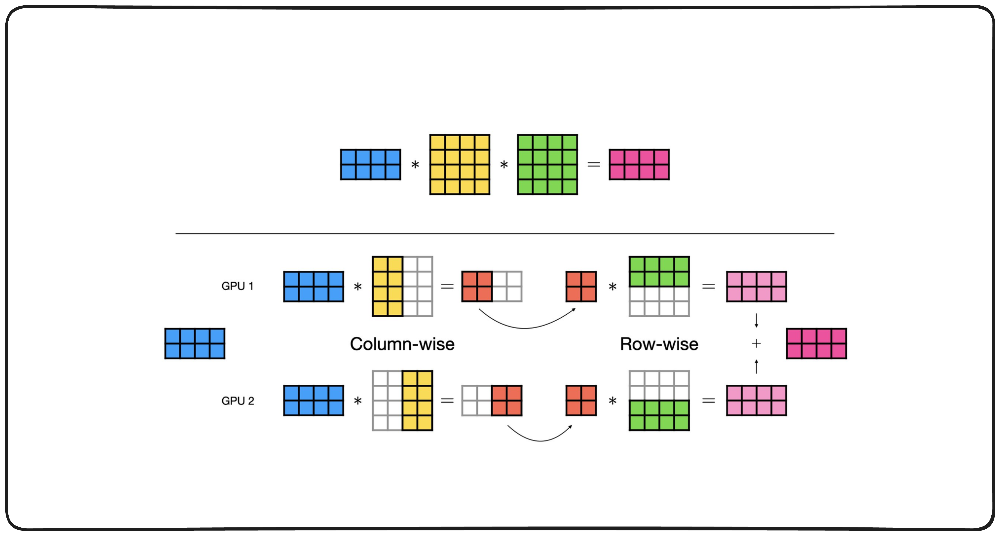

## 7. Scaling Strategy: Pipeline Parallelism (PP)

### The Core Idea

Pipeline Parallelism splits the model **by layers** — contiguous blocks of layers (called stages) are placed on different GPUs. While TP splits *within* a layer, PP splits *across* layers. This lets you train models that are too deep to fit on a single GPU even after TP sharding.

### How It Works

1. **Partition** — divide the model's layers into `p` stages, each assigned to a different GPU (or group of GPUs).
2. **Micro-batch** — split the global batch into smaller micro-batches.
3. **Pipeline** — feed micro-batches through the stages in sequence. While GPU-1 processes micro-batch-2's forward pass, GPU-2 is already working on micro-batch-1 — different stages work on different micro-batches simultaneously.

### The Bubble Problem

The main overhead in PP is the **pipeline bubble** — idle time at the start and end of each batch where some GPUs have nothing to do. The bubble ratio is roughly `(p-1) / (p-1+m)` where `p` is the number of stages and `m` is the number of micro-batches. More micro-batches → smaller bubble → better utilization, but also more activation memory.

### Common Schedules

- **GPipe** — all forwards first, then all backwards. Simple but high activation memory.
- **1F1B (One Forward, One Backward)** — after a warmup, alternate one forward and one backward per step. More memory-efficient since activations are freed earlier.
- **ZB-H2** — splits backward into activation-gradient and weight-gradient phases to approach zero bubble, at the cost of higher peak memory.
- **DualPipe** — bidirectional scheduling (micro-batches injected from both ends) to overlap computation with communication.

### Communication Pattern

PP uses **point-to-point send/recv** of activations between adjacent stages — much less communication than TP's per-layer collectives. This makes PP more tolerant of slower inter-node interconnect, which is why PP is typically used **across nodes** while TP stays within a node.

### Key Takeaway

PP enables very deep models by distributing layers across GPUs with lightweight inter-stage communication. The main challenge is minimizing the pipeline bubble through smart scheduling and choosing the right number of micro-batches.

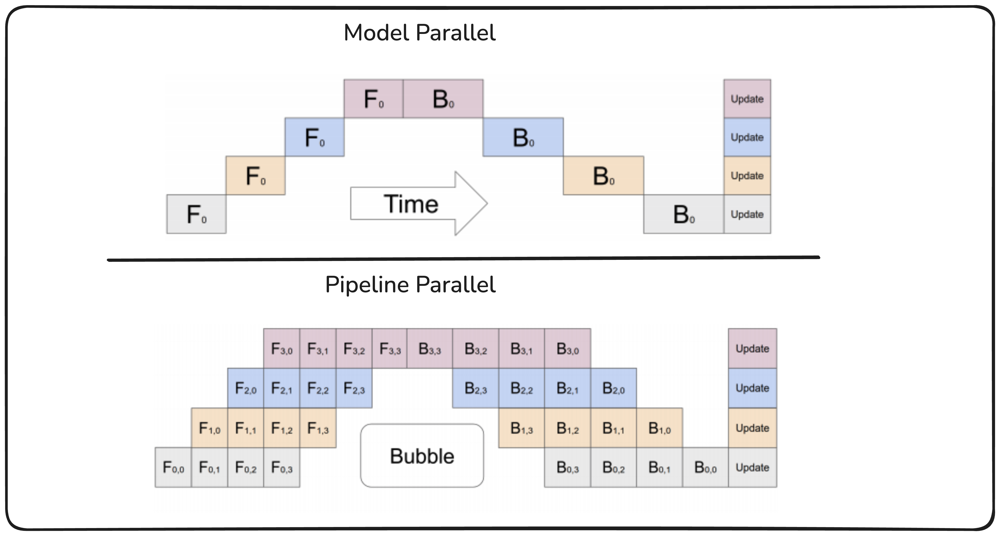

## 8. Applying Parallelism with vLLM: When to Use What

### Decision Guide

- **Model fits on 1 GPU** → No parallelism needed. Just run it.
- **Model fits on 1 node (multi-GPU)** → Use **Tensor Parallelism (TP)**.
- **Model doesn't fit on 1 node** → Use **TP within each node + Pipeline Parallelism (PP) across nodes**.
- **Model fits but you need more throughput** → Add **Data Parallelism (DP)** to replicate the setup.

**Rule of thumb:** set `tensor_parallel_size` = number of GPUs per node, `pipeline_parallel_size` = number of nodes.

### TP Only — Single Node, Multi-GPU

```python
from vllm import LLM

llm = LLM("Qwen/Qwen2.5-14B-Instruct", tensor_parallel_size=4)
output = llm.generate("Explain tensor parallelism.")
```

```bash
vllm serve Qwen/Qwen2.5-14B-Instruct \
  --tensor-parallel-size 4
```

### TP + PP — Multi-Node

When a single node isn't enough, add pipeline parallelism. Example: 2 nodes, 8 GPUs each:

```bash
# Head node
vllm serve Qwen/Qwen2.5-72B-Instruct \
  --tensor-parallel-size 8 \
  --pipeline-parallel-size 2 \
  --nnodes 2 --node-rank 0 \
  --master-addr <HEAD_NODE_IP>

# Worker node
vllm serve Qwen/Qwen2.5-72B-Instruct \
  --tensor-parallel-size 8 \
  --pipeline-parallel-size 2 \
  --nnodes 2 --node-rank 1 \
  --master-addr <HEAD_NODE_IP> --headless
```

### DP — Scaling Throughput

Data parallelism replicates the full model across GPU groups. Each replica handles different requests independently. In vLLM:

```bash
vllm serve Qwen/Qwen2.5-7B-Instruct \
  --tensor-parallel-size 4 \
  --data-parallel-size 2 \
  --data-parallel-size-local 2
```

This creates 2 replicas, each using 4 GPUs with TP — total 8 GPUs.

### Quick Reference

| Scenario | Strategy | Example Flags |
|----------|----------|---------------|
| Model fits on 1 GPU | None | (default) |
| Model fits on 1 node, 4 GPUs | TP=4 | `--tensor-parallel-size 4` |
| Model needs 2 nodes × 8 GPUs | TP=8, PP=2 | `--tensor-parallel-size 8 --pipeline-parallel-size 2` |
| Need more throughput on 8 GPUs | TP=4, DP=2 | `--tensor-parallel-size 4 --data-parallel-size 2` |

### Edge Cases

- **No NVLink between GPUs** (e.g., L40S) — prefer PP over TP, since PP uses lightweight point-to-point communication instead of TP's bandwidth-heavy per-layer collectives.
- **Uneven GPU split** — use PP (`--pipeline-parallel-size`) with `--tensor-parallel-size 1`, since PP supports uneven layer splits.
- **MoE models** — use Expert Parallelism (EP) for the expert layers combined with DP for the attention layers. See vLLM's data parallel deployment docs for details.